## Importing the pywavan functions and the required liberaries

In [1]:
%pylab inline
from pywavan import fbm2d
from pywavan import powspec
from pywavan import imsmooth
from pywavan import fan_trans
from pywavan import tauq
from pywavan import Dh
from pywavan import angluarPS
import itertools
from scipy.stats import linregress
from scipy import interpolate

Populating the interactive namespace from numpy and matplotlib


## Generating the normally-distributed image

In [2]:
#Create a nx X ny pixels map with a power law gamma
nx = 512
ny = 512
gamma = -3

fbm= fbm2d(gamma, ny,nx)
wt, S11a, wav_k, S1a, q = fan_trans(fbm, zeromean=False, reso=1, q=0, qdyn=False, angular=True)

Text(0.5, 1.0, 'Reconstructued fBm')

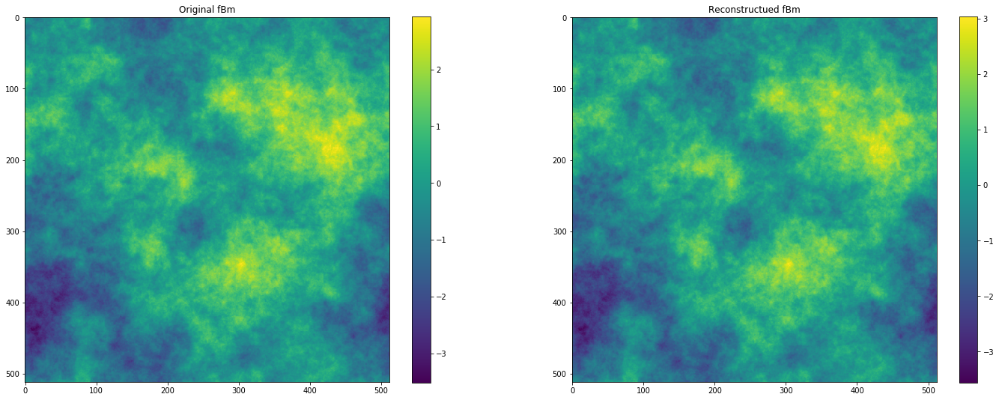

In [3]:
#Reconstructing the fBm after using fan_trans by summing over the angles (j) and the scales (i)

fBm=np.zeros((ny,nx)) #The reconstructed fBm

fBm=np.sum(wt.real,axis=0) #Summing over the angles
fBm=np.sum(fBm,axis=0) #Summing over the scales

figure(figsize=(24,9))
plt.subplot(1,2,1)
imshow(fbm)
colorbar()
plt.title('Original fBm')
plt.subplot(1,2,2)
imshow(fBm)
colorbar()
plt.title('Reconstructued fBm')

Text(0.5, 1.0, 'Multiplicative model')

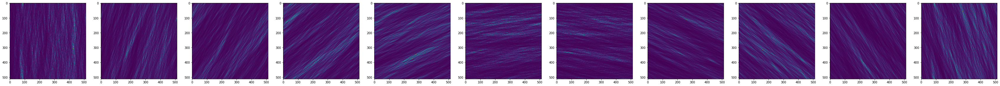

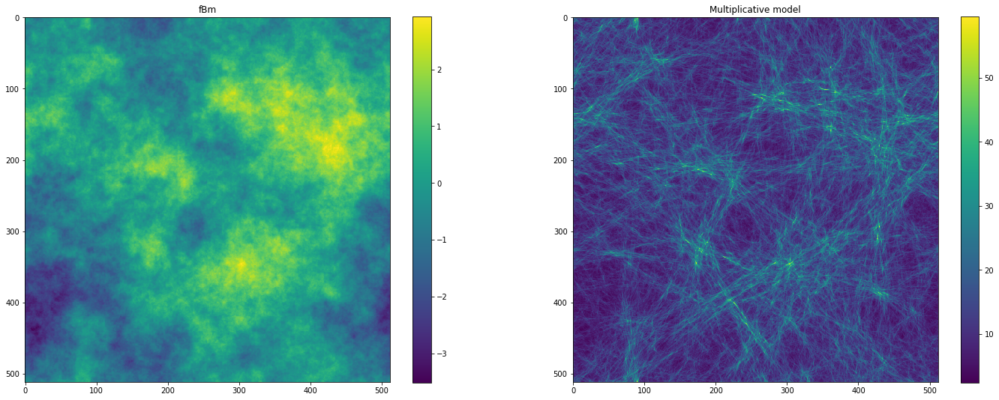

In [4]:
#Constructing the filamentary multiplicative model by multiplying the scales (i) and adding over the angles (j)
#The standard deviation of the scales is changed to std_G then it is exponentiated to force a log-normal distribution before the multiplication

N=wt.shape[1] #Number of angles
M=wt.shape[0] #number of scales
std_G=0.1 #The standard deviation of the Gaussian images (before the exponential), this parameter control the difference between the G and the NG slopes. typical value is 0.1

mpv=np.zeros((ny,nx)) #The multiplicative model
mpv_ang=np.ones((N,ny,nx)) #The anglular components of the multiplicative model

for j in range(N): #Looping over angles
    
    for i in range(M): #looping over scales
        
        t=wt[i,j,:,:].real #A temporary varible used to do operations on the subimage
        t=t/np.std(t)*std_G
        t=np.exp(t)
        
        mpv_ang[j,:,:]=mpv_ang[j,:,:]*t #Multiplication of scales
    mpv=mpv+mpv_ang[j,:,:] #Adding over angles

#Ploting the anglular components of the multiplicative model
figure(figsize=(60,9))
for j in range(N):
    plt.subplot(1,N,j+1)
    imshow(mpv_ang[j,:,:])

figure(figsize=(24,9))
plt.subplot(1,2,1)
imshow(fbm)
colorbar()
plt.title('fBm')
plt.subplot(1,2,2)
imshow(mpv)
colorbar()
plt.title('Multiplicative model')

In [5]:
#Calculate the power spectrum of the multiplicative model for the Gaussian and the non-Gaussian parts (q)
tab_k, spec_k_mpv= powspec(mpv, reso=1.)

q=[]
q=[2.9]*M
wt_mpv, S11a, wav_k, S1a_mpv, q = fan_trans(mpv, zeromean=False, reso=1, q=q, qdyn=True, skewl=0.4)
#Flattening the mpv. to plot the histogram
hist_mpv = list(itertools.chain.from_iterable(mpv))

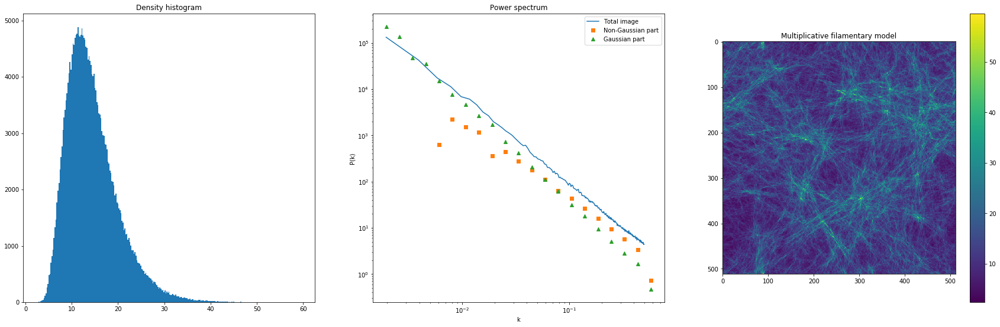

In [6]:
#Plotting
figure(figsize=(30,9))
plt.subplot(1,3,1)
plt.hist(hist_mpv,bins='auto', label='Multiplicative filamentary model')
plt.title('Density histogram')
plt.subplot(1,3,2)
plot(tab_k, spec_k_mpv, label='Total image')
plot(wav_k, S1a_mpv[1,:], 's', label='Non-Gaussian part')
plot(wav_k, S1a_mpv[2,:], '^', label='Gaussian part')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('P(k)')
plt.legend()
plt.title('Power spectrum')
plt.subplot(1,3,3)
imshow(mpv)
colorbar()
plt.title('Multiplicative filamentary model')
plt.show()


Text(0.5, 1.0, 'Homogeneous part (G)')

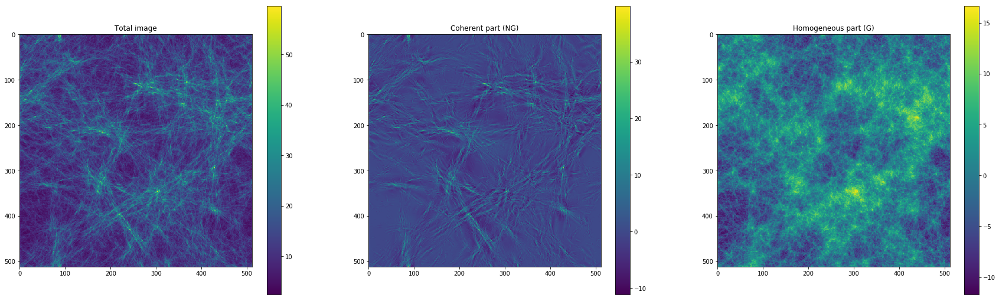

In [7]:
#Constructing and plotting the G and NG parts of the mpv. model by looping over the scales.
#wt_mpv has the scales of the G and NG parts, for more information see the help of fan_trans.

mpv_G=np.zeros((ny,nx)) #Gaussian part
mpv_NG=np.zeros((ny,nx)) #Non-Gaussian part

for i in range(M): #looping over the scales.
    mpv_G=mpv_G+wt_mpv[i+2*M,:,:].real
    mpv_NG=mpv_NG+wt_mpv[i+M,:,:].real


figure(figsize=(30,9))
plt.subplot(1,3,1)
imshow(mpv)
colorbar()
plt.title('Total image')
plt.subplot(1,3,2)
imshow(mpv_NG)
colorbar()
plt.title('Coherent part (NG)')
plt.subplot(1,3,3)
imshow(mpv_G)
colorbar()
plt.title('Homogeneous part (G)')

# Inversion algorithm

The inversion process is done using MnGSeg technique (fan_trans function). After using fan_trans to separate the scales and the angles, the image of each angle is reconstructed separately by adding all the scales then using the log() function the multiplicative process become an addition process

$$log(\Pi_i e^{k_i})=\Sigma_i k_i$$

Finally, using the fant_trans function the scales $k_i$ or $e^{k_i}$ that construct the multiplicative process can be revealed.

In [8]:
#Seprating the scales and the angles.
wt_mpv, S11a, wav_k, S1a, q = fan_trans(mpv, reso=1, zeromean=False, q=0 , qdyn=True, skewl=0.4, pownorm=False, angular=True)

In [43]:
wt_inv=np.zeros((M,N,ny,nx)) 

mpv_ang_inv=np.zeros((N,ny,nx)) #The anglular components of the image

mpv_ang_inv_log=np.zeros((N,ny,nx)) 

for j in range(N):
    print(j)
    mpv_ang_inv[j,:,:]=np.sum(wt_mpv[:,j,:,:].real,axis=0)+np.mean(mpv_ang[j,:,:])    #the image for this specific angle
    #mpv_ang_inv[j,:,:]=np.sum(wt_mpv[:,j,:,:].real,axis=0)+5    #the image for this specific angle
    
    mpv_ang_inv_log[j,:,:]=log(mpv_ang_inv[j,:,:])
    
    l=numpy.isnan(mpv_ang_inv_log)
    mpv_ang_inv_log[l]=0
    
    wt_inv[:,j,:,:], S11a, wav_k, S1a, q = fan_trans(mpv_ang_inv_log[j,:,:], zeromean=False, reso=1, q=0 , qdyn=True, skewl=0.4, pownorm=False)    
    

0


/nix/store/c1vk9xd7sixznbayzaxlbr2dg0v7j4y4-python3.6-ipykernel-5.1.0/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: invalid value encountered in log
  if sys.path[0] == '':
/nix/store/c1vk9xd7sixznbayzaxlbr2dg0v7j4y4-python3.6-ipykernel-5.1.0/lib/python3.6/site-packages/ipykernel_launcher.py:17: ComplexWarning: Casting complex values to real discards the imaginary part


1
2
3
4
5
6
7
8
9
10


NameError: name 'بلاة' is not defined

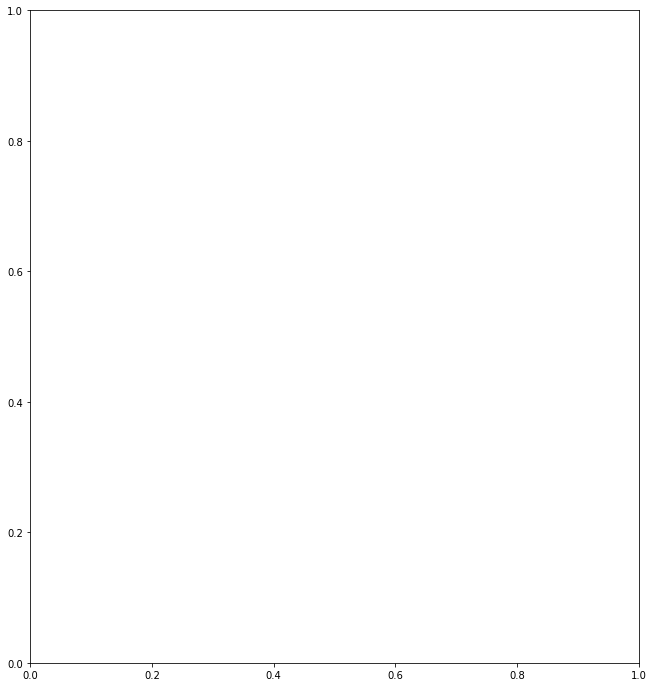

In [45]:
#Comparing the angular components of the original mpv. model and the inversion process.
l=numpy.isnan(mpv_ang_inv_log)
mpv_ang_inv_log[l]=0
mpv_inv=np.sum(mpv_ang_inv_log,axis=0)

figure(figsize=(24,12))
plt.subplot(1,2,1)
imshow(mpv)
colorbar()
plt.title('Original multiplicative model')
plt.subplot(1,2,2)
imshow(mpv_inv)
colorbar()
plt.title('Reconstructed image')

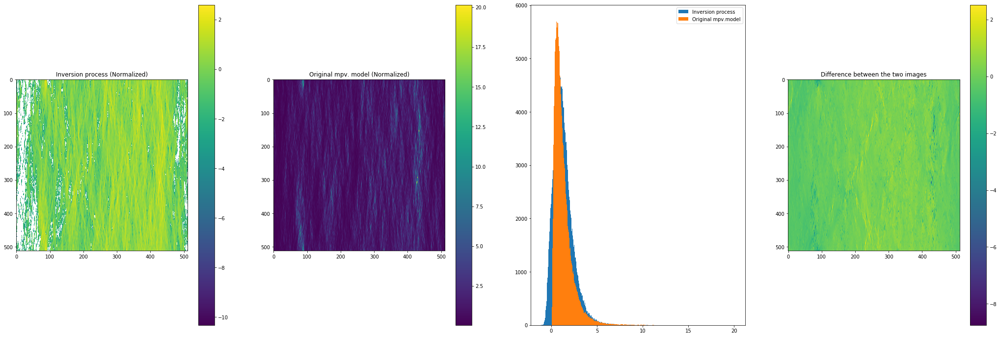

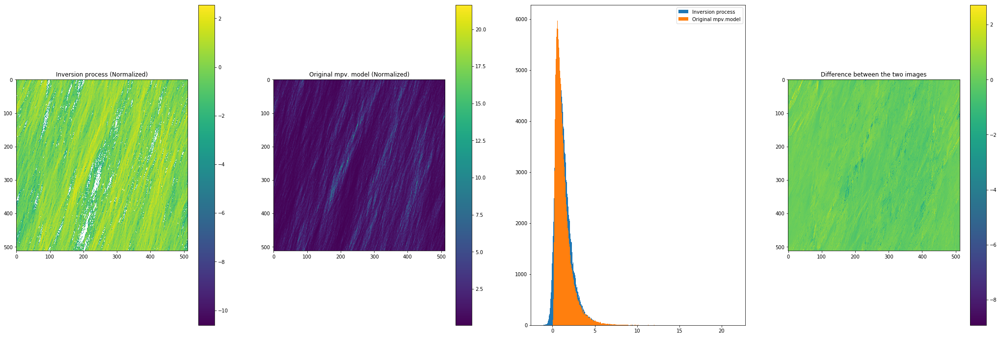

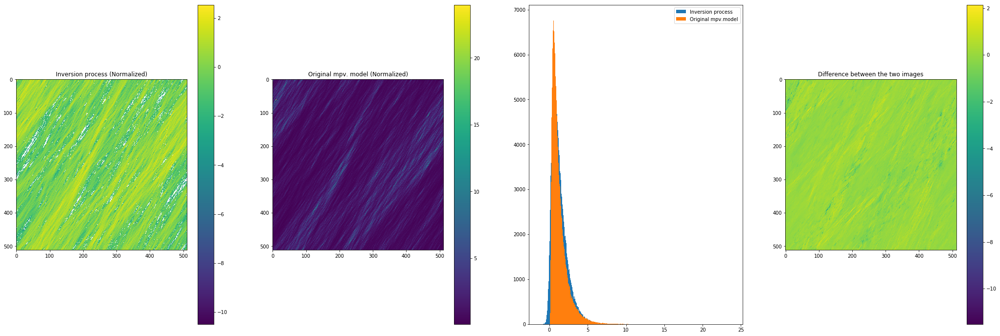

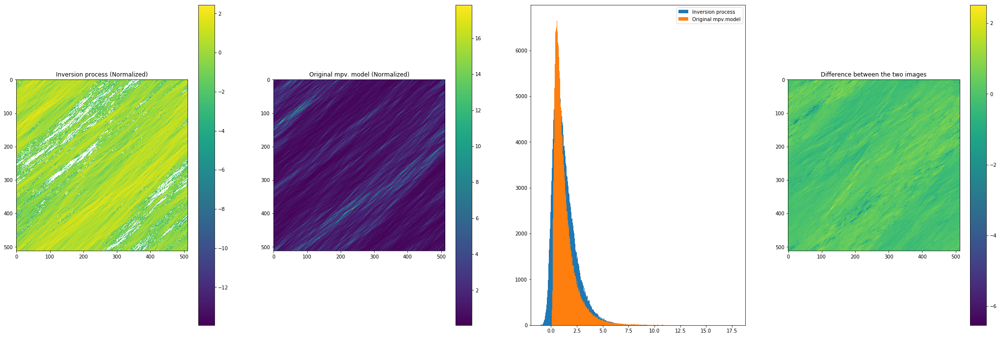

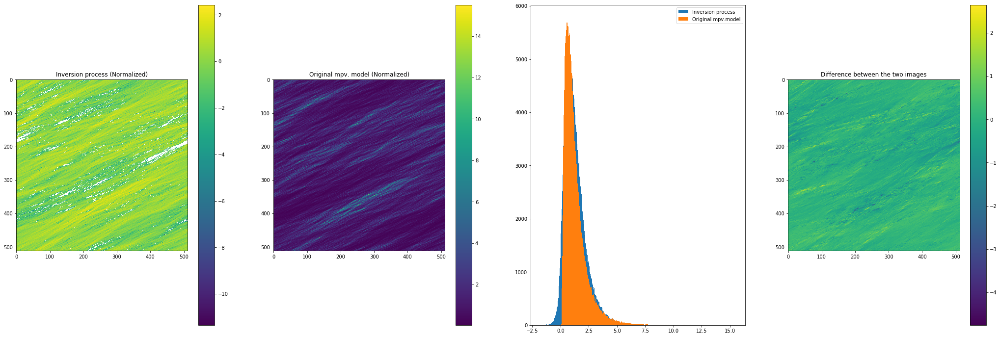

...

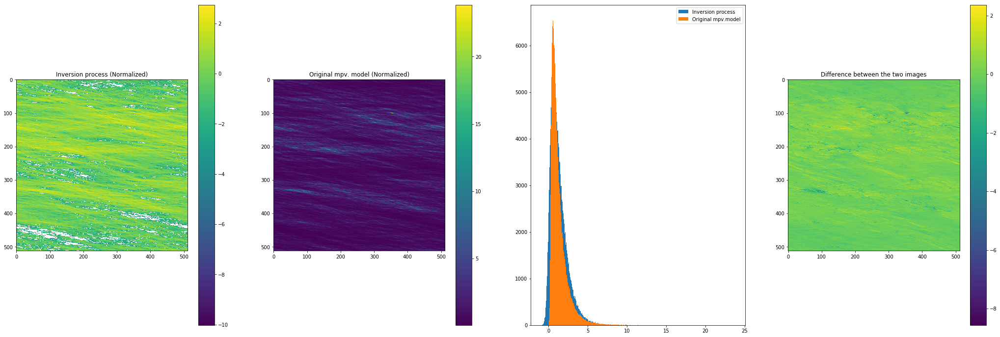

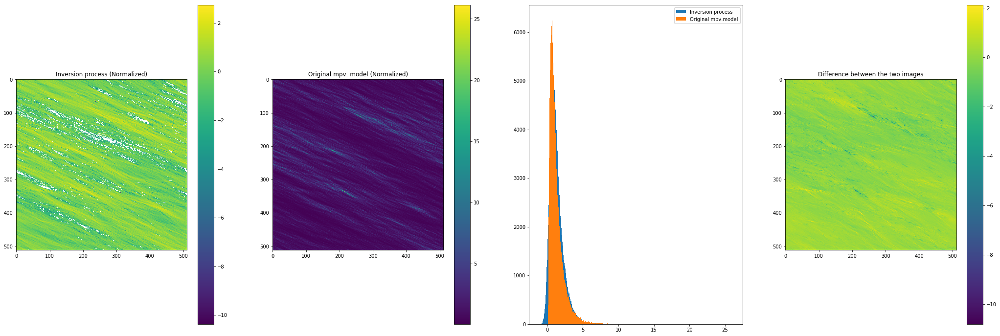

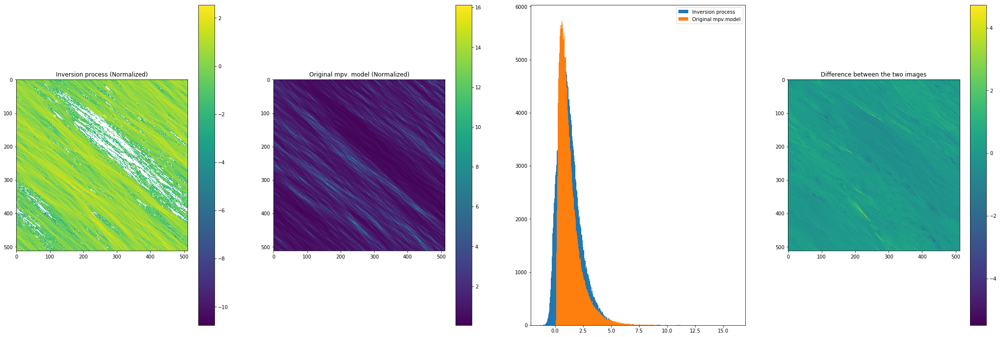

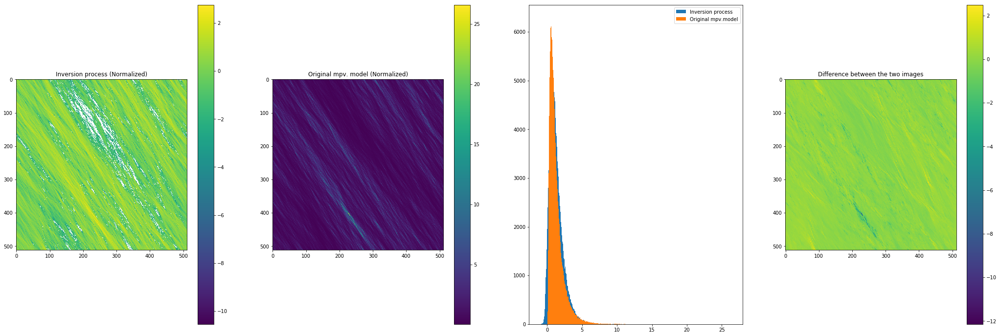

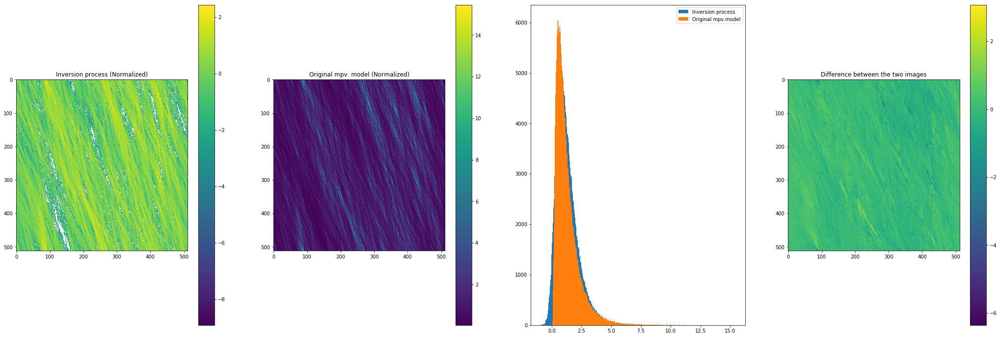

In [26]:
for j in range(N):
    
    '''
    mpv_ang_inv[j,:,:]=mpv_ang_inv[j,:,:]/np.std(mpv_ang_inv[j,:,:])
    mpv_ang[j,:,:]=mpv_ang[j,:,:]/np.std(mpv_ang[j,:,:])
    '''
    #mpv_ang_inv[j,:,:]=mpv_ang_inv[j,:,:]-np.mean(mpv_ang_inv[j,:,:])
    #mpv_ang[j,:,:]=mpv_ang[j,:,:]-np.mean(mpv_ang[j,:,:])
    
    hist_mpv_ang = list(itertools.chain.from_iterable(mpv_ang[j,:,:]))
    hist_mpv_ang_inv = list(itertools.chain.from_iterable(mpv_ang_inv[j,:,:]))
    difference=mpv_ang_inv[j,:,:]-mpv_ang[j,:,:]
    #l=(difference==0)
    #difference[~l]=nan
    
    
    figure(figsize=(36,12))
    plt.subplot(1,4,1)
    imshow(mpv_ang_inv_log[j,:,:])
    colorbar()
    plt.title('Inversion process (Normalized)')
    plt.subplot(1,4,2)
    imshow(mpv_ang[j,:,:])
    colorbar()
    plt.title('Original mpv. model (Normalized)')
    plt.subplot(1,4,3)
    plt.hist(hist_mpv_ang_inv,bins='auto', label='Inversion process')
    plt.hist(hist_mpv_ang,bins='auto', label='Original mpv.model')
    plt.legend()
    plt.subplot(1,4,4)
    imshow(difference)
    plt.title('Difference between the two images')
    colorbar()